# Final_Project_for_MSc
```


In [1]:
import seaborn as sns
from astropy.table import Table
import pandas as pd
import matplotlib.pyplot as plt
import os
import plotly.express as px

# Data Processing
from sklearn.impute import SimpleImputer

import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC



# New Section Exoplanet

In [2]:
my_data=pd.read_csv('phl_exoplanet_catalog_2019.csv')
my_data

,P_NAME,P_STATUS,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_UPDATED,...,P_HABZONE_CON,P_TYPE_TEMP,P_HABITABLE,P_ESI,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG,P_RADIUS_EST,P_MASS_EST,P_SEMI_MAJOR_AXIS_EST
0,11 Com b,3.0,6165.86330,-476.74200,476.74200,NaN,NaN,NaN,2007,2014-05-14,...,0,Hot,0,0.083813,Coma Berenices,Com,Berenice's Hair,12.082709,6165.863300,1.29000
1,11 UMi b,3.0,4684.78480,-794.57001,794.57001,NaN,NaN,NaN,2009,2018-09-06,...,0,Hot,0,0.082414,Ursa Minor,UMi,Little Bear,12.229641,4684.784800,1.53000
2,14 And b,3.0,1525.57440,NaN,NaN,NaN,NaN,NaN,2008,2014-05-14,...,0,Hot,0,0.081917,Andromeda,And,Andromeda,12.848516,1525.574400,0.83000
3,14 Her b,3.0,1481.07850,-47.67420,47.67420,NaN,NaN,NaN,2002,2018-09-06,...,0,Cold,0,0.145241,Hercules,Her,Hercules,12.865261,1481.078500,2.93000
4,16 Cyg B b,3.0,565.73385,-25.42624,25.42624,NaN,NaN,NaN,1996,2018-09-06,...,1,Warm,0,0.368627,Cygnus,Cyg,Swan,13.421749,565.733850,1.66000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4043,K2-296 b,3.0,NaN,NaN,NaN,1.87,0.45,0.2,2019,5/23/19,...,0,Warm,2,0.755038,Virgo,Vir,Virgin,1.870000,4.155456,0.13456
4044,K2-296 c,3.0,NaN,NaN,NaN,2.76,NaN,NaN,2019,5/23/19,...,0,Hot,0,0.363831,Virgo,Vir,Virgin,2.760000,8.047485,0.05769
4045,GJ 1061 b,3.0,1.38000,0.15000,0.16000,NaN,NaN,NaN,2019,9/3/19,...,0,Hot,0,0.588562,Horologium,Hor,Pendulum Clock,1.102775,1.380000,0.02100
4046,GJ 1061 c,3.0,1.75000,0.23000,0.23000,NaN,NaN,NaN,2019,9/3/19,...,0,Warm,1,0.879042,Horologium,Hor,Pendulum Clock,1.178333,1.750000,0.03500


In [3]:
my_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4048 entries, 0 to 4047
Columns: 112 entries, P_NAME to P_SEMI_MAJOR_AXIS_EST
dtypes: float64(94), int64(4), object(14)
memory usage: 3.5+ MB


In [4]:
my_data.describe()

,P_STATUS,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_PERIOD,P_PERIOD_ERROR_MIN,...,S_SNOW_LINE,S_ABIO_ZONE,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_HABITABLE,P_ESI,P_RADIUS_EST,P_MASS_EST,P_SEMI_MAJOR_AXIS_EST
count,4048.0,1598.000000,1467.000000,1467.000000,3139.000000,3105.000000,3105.000000,4048.000000,3.938000e+03,3.807000e+03,...,3786.000000,3.083000e+03,3281.000000,4048.000000,4048.000000,4048.000000,3721.000000,4048.000000,4048.000000,3978.000000
mean,3.0,798.384920,-152.292232,190.289692,4.191426,-0.483990,0.621867,2014.212945,2.309342e+03,-1.073631e+03,...,3.513348,1.768991e+35,0.440103,0.049654,0.034091,0.021986,0.261252,5.588647,323.089993,4.011385
std,0.0,1406.808654,783.366353,1082.061976,4.776830,1.409048,2.007592,3.704839,1.167012e+05,5.943181e+04,...,5.463171,6.944274e+36,0.074285,0.217256,0.181485,0.195731,0.131333,5.392733,965.084290,62.389968
min,3.0,0.019070,-24965.390000,0.000000,0.336300,-54.592700,0.000000,1989.000000,9.070629e-02,-3.650000e+06,...,0.002405,7.293660e-05,0.030707,0.000000,0.000000,0.000000,0.006768,0.000000,0.000000,0.004400
25%,3.0,26.548968,-79.457001,4.449592,1.569400,-0.526870,0.145730,2014.000000,4.497336e+00,-1.129000e-03,...,1.740762,5.264169e-01,0.420337,0.000000,0.000000,0.000000,0.196982,1.703920,3.628101,0.053000
50%,3.0,273.332080,-24.154928,25.108412,2.331680,-0.235410,0.325090,2016.000000,1.187053e+01,-9.392000e-05,...,2.568600,1.429118e+00,0.448357,0.000000,0.000000,0.000000,0.271192,2.667980,7.815324,0.102199
75%,3.0,806.488560,-4.392383,85.813561,3.553570,-0.134520,0.661390,2016.000000,4.186661e+01,-1.594000e-05,...,3.661581,2.641037e+00,0.472140,0.000000,0.000000,0.000000,0.303346,11.770500,149.379160,0.260507
max,3.0,17668.059000,0.270000,26630.808000,77.349000,0.450000,68.919080,2019.000000,7.300000e+06,3.200000e-02,...,104.112780,2.726899e+38,1.322542,1.000000,1.000000,2.000000,0.931208,77.349000,17668.059000,2500.000000


<AxesSubplot:>

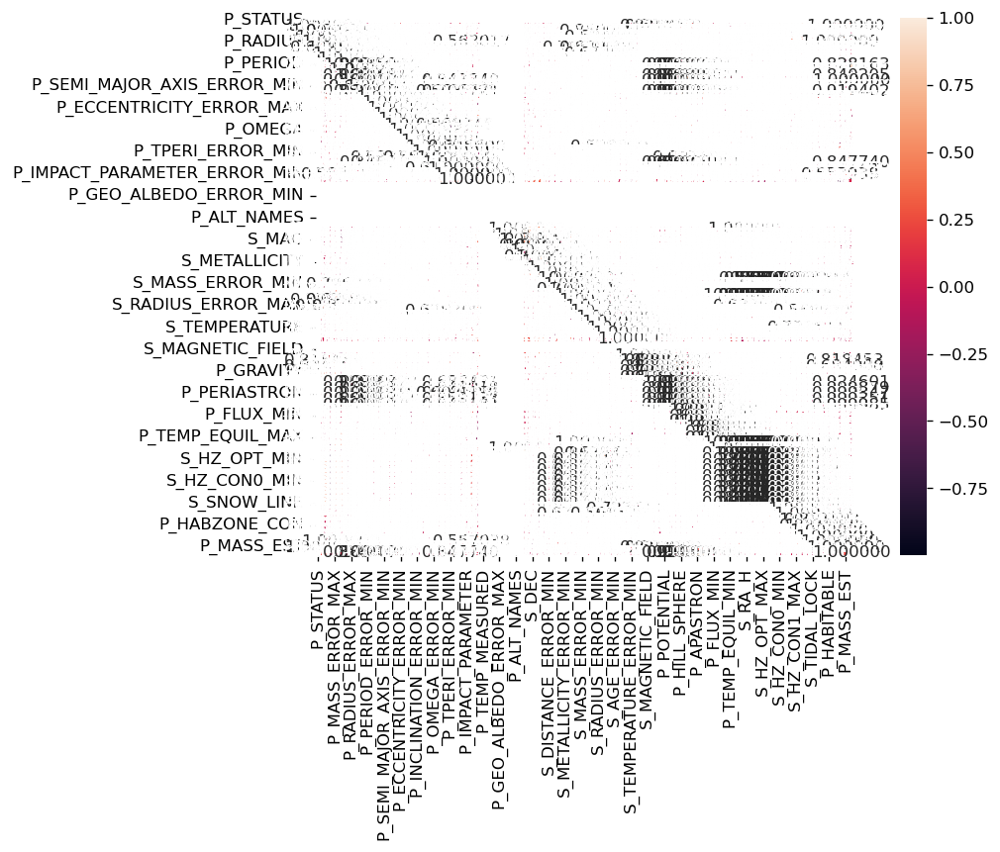

In [5]:
corr_matrix= my_data.corr()
plt.figure(figsize=(10, 6), dpi=120)
sns.heatmap(corr_matrix, annot=True, fmt='1f', square=True, cbar=True)

# Machine Learning

In [6]:
import category_encoders as ce
from sklearn.model_selection import train_test_split

X = my_data.drop(columns=['P_HABITABLE'], axis=1)
y = my_data['P_HABITABLE']
X_train, X_test, y_train, y_test = train_test_split(X, y)


In [7]:
X_train[X_train.select_dtypes(include=['object']).columns]


,P_NAME,P_UPDATED,P_DETECTION,S_NAME,S_TYPE,S_ALT_NAMES,P_TYPE,S_TYPE_TEMP,S_RA_T,S_DEC_T,P_TYPE_TEMP,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
3841,WASP-107 b,2017-08-17,Transit,WASP-107,K6,",",Jovian,K,12 33 32.8514,-10 08 46.1364,Hot,Virgo,Vir,Virgin
637,HD 217786 b,2019-01-31,Radial Velocity,HD 217786,F8 V,"HD 217786 A, HIP 113834",Jovian,F,23 03 08.2075,+00 25 46.6392,Cold,Pisces,Psc,Fishes
2559,Kepler-286 d,2014-05-14,Transit,Kepler-286,NaN,",",Terran,G,19 22 42.2784,+48 17 39.4404,Hot,Cygnus,Cyg,Swan
246,HAT-P-44 b,2014-05-14,Transit,HAT-P-44,NaN,",",Jovian,K,14 12 34.5804,+47 00 52.8732,Hot,Bootes,Boo,Herdsman
2037,Kepler-1522 b,2016-05-10,Transit,Kepler-1522,NaN,",",Superterran,G,19 19 22.3779,+52 04 12.5760,Hot,Cygnus,Cyg,Swan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2320,Kepler-203 b,2014-05-14,Transit,Kepler-203,NaN,",",Neptunian,G,19 48 21.5982,+41 23 16.9404,Hot,Cygnus,Cyg,Swan
1312,KIC 8540376 b,2016-01-05,Transit,KOI-7892,NaN,",",Neptunian,F,18 49 30.6107,+44 41 40.5312,Hot,Lyra,Lyr,Lyre
3681,MOA-2010-BLG-328L b,2015-06-04,Microlensing,MOA-2010-BLG-328L,NaN,",",Superterran,NaN,17 57 59.1233,-30 42 54.6300,NaN,Scorpius,Sco,Scorpion
2688,Kepler-330 b,2014-05-14,Transit,Kepler-330,NaN,",",Terran,K,19 13 47.3736,+44 48 06.0660,Hot,Cygnus,Cyg,Swan


In [8]:
X_train['P_DETECTION'].value_counts()


Transit                          2328
Radial Velocity                   581
Microlensing                       54
Imaging                            39
Transit Timing Variations          13
Eclipse Timing Variations          10
Orbital Brightness Modulation       5
Pulsar Timing                       3
Pulsation Timing Variations         2
Astrometry                          1
Name: P_DETECTION, dtype: int64

In [9]:
import category_encoders as ce
from sklearn.model_selection import train_test_split

X = my_data.drop(columns=['P_MASS'], axis=1)
y = my_data['P_MASS']
X_train, X_test, y_train, y_test = train_test_split(X, y)


In [10]:
X_train[X_train.select_dtypes(include=['object']).columns]

,P_NAME,P_UPDATED,P_DETECTION,S_NAME,S_TYPE,S_ALT_NAMES,P_TYPE,S_TYPE_TEMP,S_RA_T,S_DEC_T,P_TYPE_TEMP,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
1252,K2-72 d,2017-10-26,Transit,K2-72,NaN,",",Terran,M,22 18 29.2791,-09 36 44.5752,Hot,Aquarius,Aqr,Water Carrier
20,47 UMa b,2014-05-14,Radial Velocity,47 UMa,G0 V,"HD 95128, HIP 53721",Jovian,G,10 59 27.9769,+40 25 48.9216,Warm,Ursa Major,UMa,Big Bear
1501,Kepler-1109 b,2016-05-10,Transit,Kepler-1109,NaN,",",Superterran,G,19 26 35.1022,+39 23 47.8464,Hot,Lyra,Lyr,Lyre
2932,Kepler-441 b,2015-01-06,Transit,Kepler-441,NaN,",",Superterran,K,18 58 16.0605,+49 00 45.1656,Cold,Draco,Dra,Dragon
1767,Kepler-1317 b,2016-05-10,Transit,Kepler-1317,NaN,",",Superterran,K,19 26 26.8551,+42 06 57.4956,Hot,Lyra,Lyr,Lyre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1631,Kepler-1212 b,2016-05-10,Transit,Kepler-1212,NaN,",",Superterran,F,19 47 24.8274,+50 02 14.4744,Hot,Cygnus,Cyg,Swan
1453,Kepler-1075 b,2016-05-10,Transit,Kepler-1075,NaN,",",Terran,K,19 10 00.2866,+47 28 09.3684,Hot,Lyra,Lyr,Lyre
3790,ROXs 42 B b,2014-05-14,Imaging,ROXs 42 B,M0,",",Jovian,M,16 31 15.0192,-24 32 43.6956,NaN,Ophiuchus,Oph,Serpent Holder
1225,K2-52 b,2019-01-31,Transit,K2-52,NaN,",",Jovian,F,16 26 26.7439,-24 58 11.8128,Hot,Scorpius,Sco,Scorpion


# Our_Solar_System

In [11]:
our_data=pd.read_csv('planets_updated.csv')
our_data

,Planet,Color,Mass (10^24kg),Diameter (km),Density (kg/m^3),Surface Gravity(m/s^2),Escape Velocity (km/s),Rotation Period (hours),Length of Day (hours),Distance from Sun (10^6 km),...,Mean Temperature (C),Surface Pressure (bars),Number of Moons,Ring System?,Global Magnetic Field?,Surface Temperature (C),Atmospheric Composition,Atmospheric Pressure (bars),Surface Features,Composition
0,Mercury,Grey,0.330,4879,5429,3.7,4.3,1407.6,4222.6,57.9,...,167,0,0,No,Yes,-173 to 427,Mostly None,Trace,"Craters, Scarps",Rock and Metal
1,Venus,Brown and Grey,4.870,12104,5243,8.9,10.4,-5832.5,2802.0,108.2,...,464,92,0,No,No,462,Carbon Dioxide (96.5%),92,"Volcanoes, Venusian Plains",Rock and Metal
2,Earth,"Blue, Brown Green and White",5.970,12756,5514,9.8,11.2,23.9,24.0,149.6,...,15,1,1,No,Yes,-89 to 58,"Nitrogen (78.1%), Oxygen",1,"Mountains, Oceans, Forests","Rock, Water, and Air"
3,Mars,"Red, Brown and Tan",0.642,6792,3934,3.7,5.0,24.6,24.7,228.0,...,-65,0.01,2,No,No,-153 to 20,Carbon Dioxide (95.3%),0.006,"Valles Marineris, Olympus Mons",Rock and Ice
4,Jupiter,"Brown, Orange and Tan, with White cloud stripes",1898.000,142984,1326,23.1,59.5,9.9,9.9,778.5,...,-110,Unknown,79,Yes,Yes,-108 to -150,"Hydrogen, Helium",Unknown,"Great Red Spot, Jupiter's Rings",Gas and Liquid
5,Saturn,"Golden, Brown, and Blue-Grey",568.000,120536,687,9.0,35.5,10.7,10.7,1432.0,...,-140,Unknown,82,Yes,Yes,-178 to -228,"Hydrogen, Helium",Unknown,"Rings, Cassini Division, Saturn's Hexagon",Gas and Liquid
6,Uranus,Blue-Green,86.800,51118,1270,8.7,21.3,-17.2,17.2,2867.0,...,-195,Unknown,27,Yes,Yes,-197,"Hydrogen, Helium",Unknown,"Rings, Miranda's Cliff, Oberon's Craters",Gas and Ice
7,Neptune,Blue,102.000,49528,1638,11.0,23.5,16.1,16.1,4515.0,...,-200,Unknown,14,Yes,Yes,-201,"Hydrogen, Helium",Unknown,"Great Dark Spot, Triton's Geysers",Gas and Ice


In [12]:
our_data.head()

,Planet,Color,Mass (10^24kg),Diameter (km),Density (kg/m^3),Surface Gravity(m/s^2),Escape Velocity (km/s),Rotation Period (hours),Length of Day (hours),Distance from Sun (10^6 km),...,Mean Temperature (C),Surface Pressure (bars),Number of Moons,Ring System?,Global Magnetic Field?,Surface Temperature (C),Atmospheric Composition,Atmospheric Pressure (bars),Surface Features,Composition
0,Mercury,Grey,0.330,4879,5429,3.7,4.3,1407.6,4222.6,57.9,...,167,0,0,No,Yes,-173 to 427,Mostly None,Trace,"Craters, Scarps",Rock and Metal
1,Venus,Brown and Grey,4.870,12104,5243,8.9,10.4,-5832.5,2802.0,108.2,...,464,92,0,No,No,462,Carbon Dioxide (96.5%),92,"Volcanoes, Venusian Plains",Rock and Metal
2,Earth,"Blue, Brown Green and White",5.970,12756,5514,9.8,11.2,23.9,24.0,149.6,...,15,1,1,No,Yes,-89 to 58,"Nitrogen (78.1%), Oxygen",1,"Mountains, Oceans, Forests","Rock, Water, and Air"
3,Mars,"Red, Brown and Tan",0.642,6792,3934,3.7,5.0,24.6,24.7,228.0,...,-65,0.01,2,No,No,-153 to 20,Carbon Dioxide (95.3%),0.006,"Valles Marineris, Olympus Mons",Rock and Ice
4,Jupiter,"Brown, Orange and Tan, with White cloud stripes",1898.000,142984,1326,23.1,59.5,9.9,9.9,778.5,...,-110,Unknown,79,Yes,Yes,-108 to -150,"Hydrogen, Helium",Unknown,"Great Red Spot, Jupiter's Rings",Gas and Liquid


In [13]:
size = len(our_data)
columns = our_data.columns
n_columns = len(columns)

print(f"Total Number of Columns : {n_columns}")

Total Number of Columns : 27


In [14]:
columns

Index(['Planet', 'Color', 'Mass (10^24kg)', 'Diameter (km)',
       'Density (kg/m^3)', 'Surface Gravity(m/s^2)', 'Escape Velocity (km/s)',
       'Rotation Period (hours)', 'Length of Day (hours)',
       'Distance from Sun (10^6 km)', 'Perihelion (10^6 km)',
       'Aphelion (10^6 km)', 'Orbital Period (days)',
       'Orbital Velocity (km/s)', 'Orbital Inclination (degrees)',
       'Orbital Eccentricity', 'Obliquity to Orbit (degrees)',
       'Mean Temperature (C)', 'Surface Pressure (bars)', 'Number of Moons',
       'Ring System?', 'Global Magnetic Field?', 'Surface Temperature (C)',
       'Atmospheric Composition', 'Atmospheric Pressure (bars)',
       'Surface Features', 'Composition'],
      dtype='object')

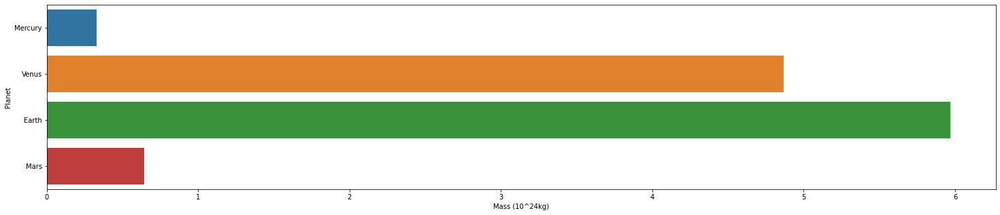

In [15]:
names = our_data['Planet'][:4]
values = our_data['Mass (10^24kg)'][:4]

# Plot
fig = px.pie(names=names, values=values, title="Rocky Planet's Mass Distribution", hole=0.3, height=600)
fig.update_layout({'title':{'x':0.5}})
fig.show()

# Bar Plot
plt.figure(figsize=(25,5))
sns.barplot(y=names,x=values)
plt.show()

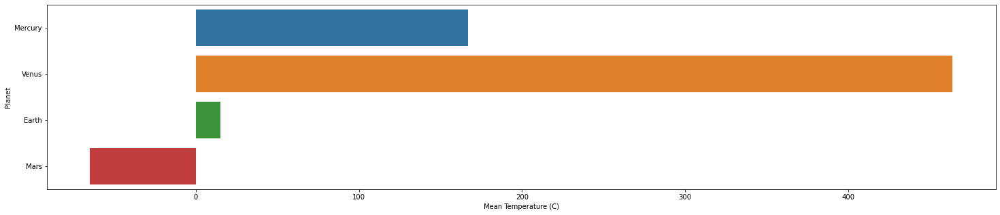

In [16]:
names = our_data['Planet'][:4]
values = our_data['Mean Temperature (C)'][:4]

# Plot
fig = px.pie(names=names, values=values, title="Rocky Planet's Mean Temperature  Distribution", hole=0, height=500)
fig.update_layout({'title':{'x':0.5}})
fig.show()

# Bar Plot
plt.figure(figsize=(25,5))
sns.barplot(y=names,x=values)
plt.show()

In [17]:
from scipy.stats import norm
from scipy.stats import t

Mass =my_data['P_MASS'].mean()

std = my_data['P_MASS'].std()
print(' mean:', Mass)
print(' std:', std)


 mean: 798.384920357234
 std: 1406.8086542573183


In [18]:


Null_values=list(zip(my_data.columns.values.tolist(),my_data.isnull().sum().tolist()))
Null_values



[('P_NAME', 0),
 ('P_STATUS', 0),
 ('P_MASS', 2450),
 ('P_MASS_ERROR_MIN', 2581),
 ('P_MASS_ERROR_MAX', 2581),
 ('P_RADIUS', 909),
 ('P_RADIUS_ERROR_MIN', 943),
 ('P_RADIUS_ERROR_MAX', 943),
 ('P_YEAR', 0),
 ('P_UPDATED', 0),
 ('P_PERIOD', 110),
 ('P_PERIOD_ERROR_MIN', 241),
 ('P_PERIOD_ERROR_MAX', 241),
 ('P_SEMI_MAJOR_AXIS', 1681),
 ('P_SEMI_MAJOR_AXIS_ERROR_MIN', 2485),
 ('P_SEMI_MAJOR_AXIS_ERROR_MAX', 2484),
 ('P_ECCENTRICITY', 2668),
 ('P_ECCENTRICITY_ERROR_MIN', 3077),
 ('P_ECCENTRICITY_ERROR_MAX', 3077),
 ('P_INCLINATION', 3204),
 ('P_INCLINATION_ERROR_MIN', 3236),
 ('P_INCLINATION_ERROR_MAX', 3238),
 ('P_OMEGA', 3302),
 ('P_OMEGA_ERROR_MIN', 3355),
 ('P_OMEGA_ERROR_MAX', 3355),
 ('P_TPERI', 3567),
 ('P_TPERI_ERROR_MIN', 3576),
 ('P_TPERI_ERROR_MAX', 3576),
 ('P_ANGULAR_DISTANCE', 1687),
 ('P_IMPACT_PARAMETER', 2639),
 ('P_IMPACT_PARAMETER_ERROR_MIN', 2641),
 ('P_IMPACT_PARAMETER_ERROR_MAX', 2641),
 ('P_TEMP_MEASURED', 4043),
 ('P_GEO_ALBEDO', 4048),
 ('P_GEO_ALBEDO_ERROR_MIN', 

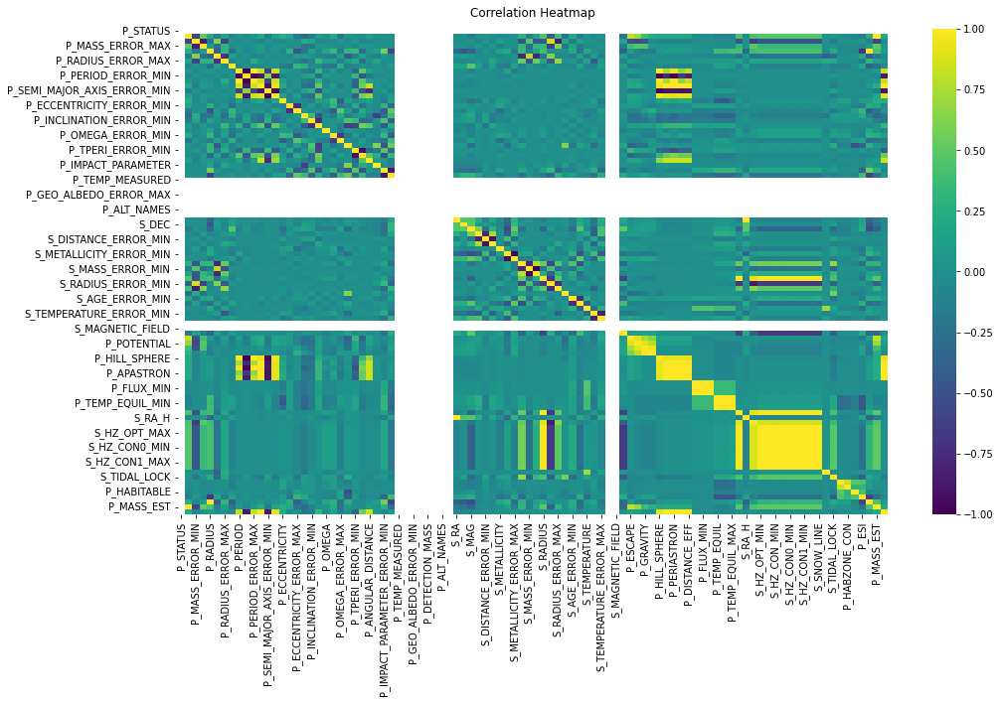

In [19]:
plt.figure(figsize=(16,9))

heatmap = sns.heatmap(my_data.corr(), vmin=-1,vmax=1, annot=False, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()


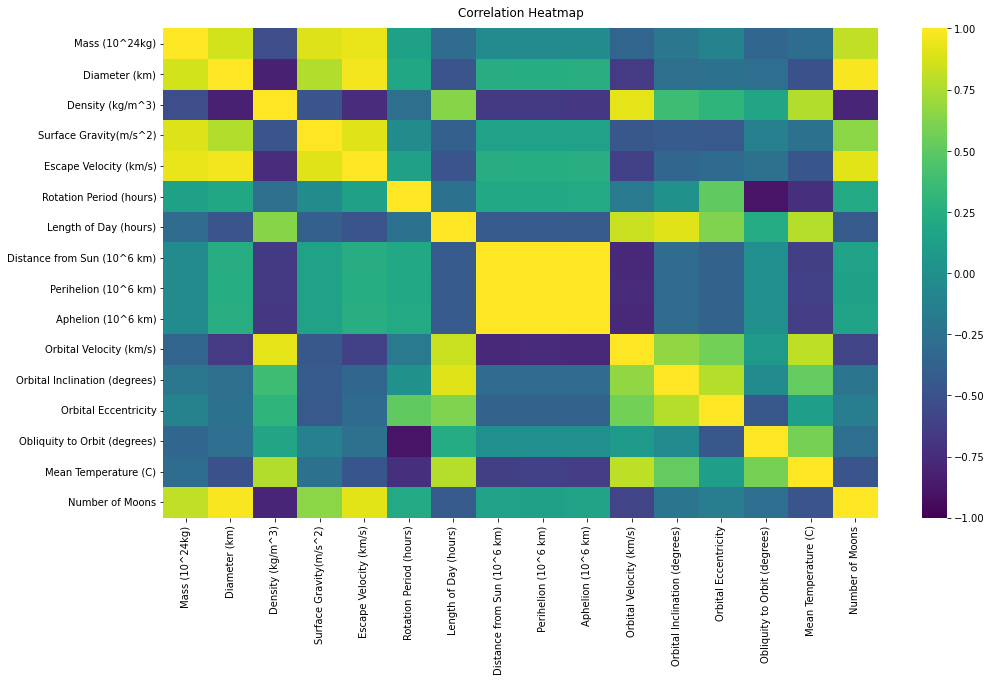

In [20]:
plt.figure(figsize=(16,9))

heatmap = sns.heatmap(our_data.corr(), vmin=-1,vmax=1, annot=False, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()


# Visualization

In [21]:
fig1 = px.density_heatmap(my_data, x='S_MAG', y='S_LOG_G', z='P_HABITABLE')
fig2 = px.density_heatmap(my_data,x='P_TYPE',y='P_TYPE_TEMP',z='P_HABITABLE')
fig3 = px.scatter(my_data,x='P_TEMP_EQUIL',y='P_ESI',color='P_HABITABLE')
fig4 = px.density_heatmap(my_data,x='P_SEMI_MAJOR_AXIS_EST',y='S_TYPE_TEMP',z='P_HABITABLE')

fig1.show()
fig2.show()
fig3.show()
fig4.show()

In [22]:
fig3 = px.scatter(our_data,x='Mean Temperature (C)',y='Mass (10^24kg)',color='Planet')

fig1.show()
fig2.show()
fig3.show()
fig4.show()

In [23]:
fig1 = px.density_heatmap(my_data, x='S_MASS', y='P_TYPE', z='P_HABITABLE')
fig2 = px.density_heatmap(my_data,x='P_TYPE',y='P_TYPE_TEMP',z='P_HABITABLE')
fig3 = px.scatter(my_data,x='P_TEMP_EQUIL',y='P_ESI',color='P_HABITABLE')
fig4 = px.density_heatmap(my_data,x='P_SEMI_MAJOR_AXIS_EST',y='S_TYPE_TEMP',z='P_HABITABLE')

fig1.show()
fig2.show()
fig3.show()
fig4.show()

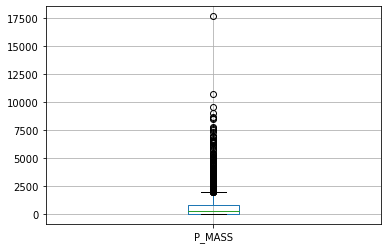

In [24]:

boxplot = my_data.boxplot(column=[ 'P_MASS',])

plt.show()


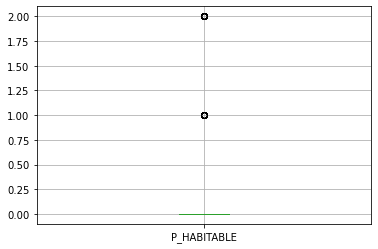

In [25]:
boxplot = my_data.boxplot(column=[ 'P_HABITABLE',])


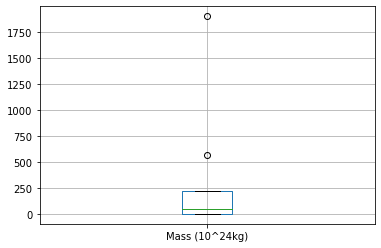

In [26]:
boxplot = our_data.boxplot(column=[ 'Mass (10^24kg)',])


<AxesSubplot:>

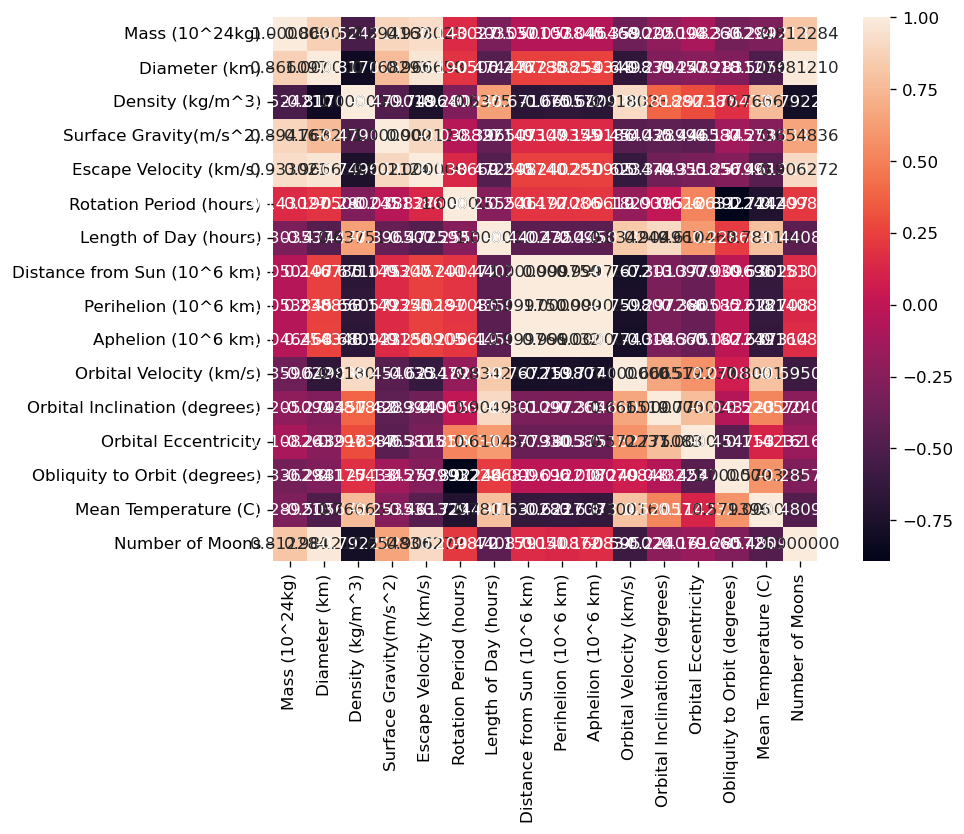

In [27]:
corr_matrix= our_data.corr()
plt.figure(figsize=(10, 6), dpi=120)
sns.heatmap(corr_matrix, annot=True, fmt='1f', square=True, cbar=True)

# Machine Learning Part

In [28]:
import category_encoders as ce
from sklearn.model_selection import train_test_split

X = our_data.drop(columns=['Mass (10^24kg)'], axis=1)
y = our_data['Mass (10^24kg)']
X_train, X_test, y_train, y_test = train_test_split(X, y)


In [29]:
X_train[X_train.select_dtypes(include=['object']).columns]

,Planet,Color,Orbital Period (days),Surface Pressure (bars),Ring System?,Global Magnetic Field?,Surface Temperature (C),Atmospheric Composition,Atmospheric Pressure (bars),Surface Features,Composition
1,Venus,Brown and Grey,224.7,92,No,No,462,Carbon Dioxide (96.5%),92,"Volcanoes, Venusian Plains",Rock and Metal
7,Neptune,Blue,"59,800",Unknown,Yes,Yes,-201,"Hydrogen, Helium",Unknown,"Great Dark Spot, Triton's Geysers",Gas and Ice
2,Earth,"Blue, Brown Green and White",365.2,1,No,Yes,-89 to 58,"Nitrogen (78.1%), Oxygen",1,"Mountains, Oceans, Forests","Rock, Water, and Air"
3,Mars,"Red, Brown and Tan",687,0.01,No,No,-153 to 20,Carbon Dioxide (95.3%),0.006,"Valles Marineris, Olympus Mons",Rock and Ice
0,Mercury,Grey,88,0,No,Yes,-173 to 427,Mostly None,Trace,"Craters, Scarps",Rock and Metal
6,Uranus,Blue-Green,"30,589",Unknown,Yes,Yes,-197,"Hydrogen, Helium",Unknown,"Rings, Miranda's Cliff, Oberon's Craters",Gas and Ice


In [30]:
import category_encoders as ce
from sklearn.model_selection import train_test_split

X = our_data.drop(columns=['Mean Temperature (C)'], axis=1)
y = our_data['Mean Temperature (C)']
X_train, X_test, y_train, y_test = train_test_split(X, y)


In [31]:
X_train[X_train.select_dtypes(include=['object']).columns]

,Planet,Color,Orbital Period (days),Surface Pressure (bars),Ring System?,Global Magnetic Field?,Surface Temperature (C),Atmospheric Composition,Atmospheric Pressure (bars),Surface Features,Composition
7,Neptune,Blue,"59,800",Unknown,Yes,Yes,-201,"Hydrogen, Helium",Unknown,"Great Dark Spot, Triton's Geysers",Gas and Ice
1,Venus,Brown and Grey,224.7,92,No,No,462,Carbon Dioxide (96.5%),92,"Volcanoes, Venusian Plains",Rock and Metal
2,Earth,"Blue, Brown Green and White",365.2,1,No,Yes,-89 to 58,"Nitrogen (78.1%), Oxygen",1,"Mountains, Oceans, Forests","Rock, Water, and Air"
0,Mercury,Grey,88,0,No,Yes,-173 to 427,Mostly None,Trace,"Craters, Scarps",Rock and Metal
3,Mars,"Red, Brown and Tan",687,0.01,No,No,-153 to 20,Carbon Dioxide (95.3%),0.006,"Valles Marineris, Olympus Mons",Rock and Ice
6,Uranus,Blue-Green,"30,589",Unknown,Yes,Yes,-197,"Hydrogen, Helium",Unknown,"Rings, Miranda's Cliff, Oberon's Craters",Gas and Ice


# Classification

In [32]:


my_data.columns.values.tolist()



['P_NAME',
 'P_STATUS',
 'P_MASS',
 'P_MASS_ERROR_MIN',
 'P_MASS_ERROR_MAX',
 'P_RADIUS',
 'P_RADIUS_ERROR_MIN',
 'P_RADIUS_ERROR_MAX',
 'P_YEAR',
 'P_UPDATED',
 'P_PERIOD',
 'P_PERIOD_ERROR_MIN',
 'P_PERIOD_ERROR_MAX',
 'P_SEMI_MAJOR_AXIS',
 'P_SEMI_MAJOR_AXIS_ERROR_MIN',
 'P_SEMI_MAJOR_AXIS_ERROR_MAX',
 'P_ECCENTRICITY',
 'P_ECCENTRICITY_ERROR_MIN',
 'P_ECCENTRICITY_ERROR_MAX',
 'P_INCLINATION',
 'P_INCLINATION_ERROR_MIN',
 'P_INCLINATION_ERROR_MAX',
 'P_OMEGA',
 'P_OMEGA_ERROR_MIN',
 'P_OMEGA_ERROR_MAX',
 'P_TPERI',
 'P_TPERI_ERROR_MIN',
 'P_TPERI_ERROR_MAX',
 'P_ANGULAR_DISTANCE',
 'P_IMPACT_PARAMETER',
 'P_IMPACT_PARAMETER_ERROR_MIN',
 'P_IMPACT_PARAMETER_ERROR_MAX',
 'P_TEMP_MEASURED',
 'P_GEO_ALBEDO',
 'P_GEO_ALBEDO_ERROR_MIN',
 'P_GEO_ALBEDO_ERROR_MAX',
 'P_DETECTION',
 'P_DETECTION_MASS',
 'P_DETECTION_RADIUS',
 'P_ALT_NAMES',
 'P_ATMOSPHERE',
 'S_NAME',
 'S_RA',
 'S_DEC',
 'S_MAG',
 'S_DISTANCE',
 'S_DISTANCE_ERROR_MIN',
 'S_DISTANCE_ERROR_MAX',
 'S_METALLICITY',
 'S_METALLIC

# A. Statistical analysis:

## 1. statistics such as mean, standard deviation, and maximum

## 2. regression analysis
## 3. cluster analysis

In [33]:
my_data.describe()

,P_STATUS,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_PERIOD,P_PERIOD_ERROR_MIN,...,S_SNOW_LINE,S_ABIO_ZONE,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_HABITABLE,P_ESI,P_RADIUS_EST,P_MASS_EST,P_SEMI_MAJOR_AXIS_EST
count,4048.0,1598.000000,1467.000000,1467.000000,3139.000000,3105.000000,3105.000000,4048.000000,3.938000e+03,3.807000e+03,...,3786.000000,3.083000e+03,3281.000000,4048.000000,4048.000000,4048.000000,3721.000000,4048.000000,4048.000000,3978.000000
mean,3.0,798.384920,-152.292232,190.289692,4.191426,-0.483990,0.621867,2014.212945,2.309342e+03,-1.073631e+03,...,3.513348,1.768991e+35,0.440103,0.049654,0.034091,0.021986,0.261252,5.588647,323.089993,4.011385
std,0.0,1406.808654,783.366353,1082.061976,4.776830,1.409048,2.007592,3.704839,1.167012e+05,5.943181e+04,...,5.463171,6.944274e+36,0.074285,0.217256,0.181485,0.195731,0.131333,5.392733,965.084290,62.389968
min,3.0,0.019070,-24965.390000,0.000000,0.336300,-54.592700,0.000000,1989.000000,9.070629e-02,-3.650000e+06,...,0.002405,7.293660e-05,0.030707,0.000000,0.000000,0.000000,0.006768,0.000000,0.000000,0.004400
25%,3.0,26.548968,-79.457001,4.449592,1.569400,-0.526870,0.145730,2014.000000,4.497336e+00,-1.129000e-03,...,1.740762,5.264169e-01,0.420337,0.000000,0.000000,0.000000,0.196982,1.703920,3.628101,0.053000
50%,3.0,273.332080,-24.154928,25.108412,2.331680,-0.235410,0.325090,2016.000000,1.187053e+01,-9.392000e-05,...,2.568600,1.429118e+00,0.448357,0.000000,0.000000,0.000000,0.271192,2.667980,7.815324,0.102199
75%,3.0,806.488560,-4.392383,85.813561,3.553570,-0.134520,0.661390,2016.000000,4.186661e+01,-1.594000e-05,...,3.661581,2.641037e+00,0.472140,0.000000,0.000000,0.000000,0.303346,11.770500,149.379160,0.260507
max,3.0,17668.059000,0.270000,26630.808000,77.349000,0.450000,68.919080,2019.000000,7.300000e+06,3.200000e-02,...,104.112780,2.726899e+38,1.322542,1.000000,1.000000,2.000000,0.931208,77.349000,17668.059000,2500.000000


In [34]:
from scipy.stats import norm
from scipy.stats import t

m1 = my_data['P_MASS'].mean()
m2 = my_data['P_GRAVITY'].mean()
m3 = my_data['P_FLUX'].mean()
m4 = my_data['S_MASS'].mean()


min_1 = my_data['S_MASS'].min()
max_2 = my_data['S_MASS'].max()
min_3 = my_data['P_MASS'].min()
max_4 = my_data['P_MASS'].max()
min_5= my_data['P_GRAVITY'].min()
max_6 = my_data['P_GRAVITY'].max()
min_7= my_data['P_FLUX'].min()
max_8 = my_data['P_FLUX'].max()



std1 = my_data['P_MASS'].std()
std2 = my_data['P_GRAVITY'].std()
std3 = my_data['P_FLUX'].std()
std4 = my_data['S_MASS'].std()


n1 = my_data['P_MASS'].count()
n2 = my_data['P_GRAVITY'].count()
n3 = my_data['P_FLUX'].count()
n4 = my_data['S_MASS'].count()

print('Sample mean  for mass:', m1)
print('Sample mean for gravity:', m2)
print('Sample mean for flux:', m3)
print('Sample mean for Stellar mass:', m4)

print('Sample std mass:', std1)
print('Sample std gravity:', std2)
print('Sample std flux:', std3)
print('Sample std stellar mass:', std4)

print('Sample count:', n1)
print('Sample count:', n2)
print('Sample count:', n3)
print('Sample count:', n4)

print('S MASS:', min_1)
print('S MASS:', max_2)

print('S MASS:', min_1)
print('S MASS:', max_2)
print('P MASS:', min_3)
print('P MASS:', max_4)
print('P GRAVITY:', min_5)
print('P GRAVITY:', max_6)
print('P_Flux:', min_7)
print('P_Flux:', max_8)


#tCr = t.ppf(1-alpha/2, n-1)
#print('Critical value of criterion, Student case:',tCr)
#print('p-value for Student, two side critical region:', 2 * t.cdf(tObs, n-1))

Sample mean  for mass: 798.384920357234
Sample mean for gravity: 14.44020930473511
Sample mean for flux: 616.6291209337568
Sample mean for Stellar mass: 1.0038376485013707
Sample std mass: 1406.8086542573183
Sample std gravity: 84.24431900677394
Sample std flux: 11412.269570714463
Sample std stellar mass: 0.652902985502673
Sample count: 1598
Sample count: 706
Sample count: 3721
Sample count: 3283
S MASS: 0.01
S MASS: 23.56
S MASS: 0.01
S MASS: 23.56
P MASS: 0.01906968
P MASS: 17668.059
P GRAVITY: 0.044184663
P GRAVITY: 1254.4501
P_Flux: 1.2395529e-08
P_Flux: 588634.37


In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split


In [36]:
df = pd.read_csv('phl_exoplanet_catalog_2019.csv')
df
# Select the relevant features as X and the target variable as Y



,P_NAME,P_STATUS,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_UPDATED,...,P_HABZONE_CON,P_TYPE_TEMP,P_HABITABLE,P_ESI,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG,P_RADIUS_EST,P_MASS_EST,P_SEMI_MAJOR_AXIS_EST
0,11 Com b,3.0,6165.86330,-476.74200,476.74200,NaN,NaN,NaN,2007,2014-05-14,...,0,Hot,0,0.083813,Coma Berenices,Com,Berenice's Hair,12.082709,6165.863300,1.29000
1,11 UMi b,3.0,4684.78480,-794.57001,794.57001,NaN,NaN,NaN,2009,2018-09-06,...,0,Hot,0,0.082414,Ursa Minor,UMi,Little Bear,12.229641,4684.784800,1.53000
2,14 And b,3.0,1525.57440,NaN,NaN,NaN,NaN,NaN,2008,2014-05-14,...,0,Hot,0,0.081917,Andromeda,And,Andromeda,12.848516,1525.574400,0.83000
3,14 Her b,3.0,1481.07850,-47.67420,47.67420,NaN,NaN,NaN,2002,2018-09-06,...,0,Cold,0,0.145241,Hercules,Her,Hercules,12.865261,1481.078500,2.93000
4,16 Cyg B b,3.0,565.73385,-25.42624,25.42624,NaN,NaN,NaN,1996,2018-09-06,...,1,Warm,0,0.368627,Cygnus,Cyg,Swan,13.421749,565.733850,1.66000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4043,K2-296 b,3.0,NaN,NaN,NaN,1.87,0.45,0.2,2019,5/23/19,...,0,Warm,2,0.755038,Virgo,Vir,Virgin,1.870000,4.155456,0.13456
4044,K2-296 c,3.0,NaN,NaN,NaN,2.76,NaN,NaN,2019,5/23/19,...,0,Hot,0,0.363831,Virgo,Vir,Virgin,2.760000,8.047485,0.05769
4045,GJ 1061 b,3.0,1.38000,0.15000,0.16000,NaN,NaN,NaN,2019,9/3/19,...,0,Hot,0,0.588562,Horologium,Hor,Pendulum Clock,1.102775,1.380000,0.02100
4046,GJ 1061 c,3.0,1.75000,0.23000,0.23000,NaN,NaN,NaN,2019,9/3/19,...,0,Warm,1,0.879042,Horologium,Hor,Pendulum Clock,1.178333,1.750000,0.03500


In [37]:
preprocessed_data = my_data.drop(['P_RADIUS_ERROR_MIN', 'P_RADIUS_ERROR_MAX',\
'P_PERIOD_ERROR_MIN', 'P_PERIOD_ERROR_MAX', 'S_NAME', 'S_MAG', 'S_DISTANCE_ERROR_MIN',\
'S_DISTANCE_ERROR_MAX', 'S_METALLICITY', 'S_METALLICITY_ERROR_MIN',\
'S_METALLICITY_ERROR_MAX', 'S_RADIUS', 'S_TEMPERATURE_ERROR_MIN',\
'S_TEMPERATURE_ERROR_MAX', 'S_LOG_G', 'P_PERIASTRON', 'P_APASTRON', 'P_DISTANCE_EFF',\
'P_FLUX_MIN', 'P_FLUX_MAX', 'P_TEMP_EQUIL_MIN', 'P_TEMP_EQUIL_MAX', 'S_RADIUS_EST',\
'S_RA_H', 'S_LUMINOSITY', 'S_HZ_OPT_MIN', 'S_HZ_OPT_MAX', 'S_HZ_CON_MIN', 'S_HZ_CON_MAX',\
'S_HZ_CON0_MIN', 'S_HZ_CON0_MAX', 'S_HZ_CON1_MIN', 'S_HZ_CON1_MAX', 'S_SNOW_LINE',\
'S_ABIO_ZONE', 'P_TYPE_TEMP', 'P_ESI', 'S_CONSTELLATION_ABR', 'P_SEMI_MAJOR_AXIS_EST'], axis = 1)
preprocessed_data.head()

,P_NAME,P_STATUS,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_YEAR,P_UPDATED,P_PERIOD,P_SEMI_MAJOR_AXIS,...,S_RA_T,S_DEC_T,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_HABITABLE,S_CONSTELLATION,S_CONSTELLATION_ENG,P_RADIUS_EST,P_MASS_EST
0,11 Com b,3.0,6165.86330,-476.74200,476.74200,NaN,2007,2014-05-14,326.03000,1.29,...,12 20 43.0286,+17 47 34.3248,0.642400,0,0,0,Coma Berenices,Berenice's Hair,12.082709,6165.86330
1,11 UMi b,3.0,4684.78480,-794.57001,794.57001,NaN,2009,2018-09-06,516.21997,1.53,...,15 17 05.8915,+71 49 26.0328,0.648683,0,0,0,Ursa Minor,Little Bear,12.229641,4684.78480
2,14 And b,3.0,1525.57440,NaN,NaN,NaN,2008,2014-05-14,185.84000,0.83,...,23 31 17.4215,+39 14 10.3128,0.600010,0,0,0,Andromeda,Andromeda,12.848516,1525.57440
3,14 Her b,3.0,1481.07850,-47.67420,47.67420,NaN,2002,2018-09-06,1773.40000,2.93,...,16 10 24.3158,+43 49 03.5256,0.445415,0,0,0,Hercules,Hercules,12.865261,1481.07850
4,16 Cyg B b,3.0,565.73385,-25.42624,25.42624,NaN,1996,2018-09-06,798.50000,1.66,...,19 41 51.9764,+50 31 03.0900,0.473325,1,1,0,Cygnus,Swan,13.421749,565.73385


In [38]:


categorical_cols = my_data.select_dtypes(include=['object']).columns
my_data[categorical_cols]



,P_NAME,P_UPDATED,P_DETECTION,S_NAME,S_TYPE,S_ALT_NAMES,P_TYPE,S_TYPE_TEMP,S_RA_T,S_DEC_T,P_TYPE_TEMP,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
0,11 Com b,2014-05-14,Radial Velocity,11 Com,K0 III,"HD 107383, HIP 60202",Jovian,K,12 20 43.0286,+17 47 34.3248,Hot,Coma Berenices,Com,Berenice's Hair
1,11 UMi b,2018-09-06,Radial Velocity,11 UMi,K4 III,"HD 136726, HIP 74793",Jovian,K,15 17 05.8915,+71 49 26.0328,Hot,Ursa Minor,UMi,Little Bear
2,14 And b,2014-05-14,Radial Velocity,14 And,G8 III,"HD 221345, HIP 116076",Jovian,G,23 31 17.4215,+39 14 10.3128,Hot,Andromeda,And,Andromeda
3,14 Her b,2018-09-06,Radial Velocity,14 Her,K0 V,"HD 145675, HIP 79248",Jovian,K,16 10 24.3158,+43 49 03.5256,Cold,Hercules,Her,Hercules
4,16 Cyg B b,2018-09-06,Radial Velocity,16 Cyg B,G2.5 V,"HD 186427, HIP 96901",Jovian,G,19 41 51.9764,+50 31 03.0900,Warm,Cygnus,Cyg,Swan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4043,K2-296 b,5/23/19,Transit,K2-296,M,0.00000,Superterran,M,11 58 49.4230,-03 23 21.7997,Warm,Virgo,Vir,Virgin
4044,K2-296 c,5/23/19,Transit,K2-296,M,0.00000,Neptunian,M,11 58 49.4230,-03 23 21.7997,Hot,Virgo,Vir,Virgin
4045,GJ 1061 b,9/3/19,Radial Velocity,GJ 1061,M5.5V,0.00000,Terran,M,03 35 59.7004,-44 30 45.7308,Hot,Horologium,Hor,Pendulum Clock
4046,GJ 1061 c,9/3/19,Radial Velocity,GJ 1061,M5.5V,0.00000,Terran,M,03 35 59.7004,-44 30 45.7308,Warm,Horologium,Hor,Pendulum Clock


In [39]:
#convert P_TYPE to ratio of diameter to earth diameter
p_type_dict = {'Miniterran':0.25, 'Subterran':0.5, 'Terran':1, 'Neptunian':4, 'Superterran':2, 'Jovian':11}
my_data['P_TYPE'] = my_data['P_TYPE'].map(p_type_dict)

#convert P_TYPE_TEMP to numerical
p_temp_dict = {'Cold':-1, 'Warm':0, 'Hot':1}
my_data['P_TYPE_TEMP'] = my_data['P_TYPE_TEMP'].map(p_temp_dict)


In [40]:
import category_encoders as ce
from sklearn.model_selection import train_test_split

X = my_data.drop(columns=['P_HABITABLE'], axis=1)
y = my_data['P_HABITABLE']
X_train, X_test, y_train, y_test = train_test_split(X, y)

X_train[X_train.select_dtypes(include=['object']).columns]

,P_NAME,P_UPDATED,P_DETECTION,S_NAME,S_TYPE,S_ALT_NAMES,S_TYPE_TEMP,S_RA_T,S_DEC_T,S_CONSTELLATION,S_CONSTELLATION_ABR,S_CONSTELLATION_ENG
557,HD 185269 b,2018-12-06,Radial Velocity,HD 185269,G0 IV,"HD 185269, HIP 96507",G,19 37 11.7445,+28 29 59.5140,Cygnus,Cyg,Swan
3673,MOA-2007-BLG-400L b,2014-10-29,Microlensing,MOA-2007-BLG-400L,NaN,",",NaN,18 09 41.9835,-29 13 26.9508,Sagittarius,Sgr,Archer
542,HD 179079 b,2018-09-27,Radial Velocity,HD 179079,G5 IV,"HD 179079, HIP 94256",G,19 11 09.8328,-02 38 18.1860,Aquila,Aql,Eagle
2021,Kepler-151 b,2014-05-14,Transit,Kepler-151,NaN,",",G,19 28 39.0704,+41 01 23.6460,Cygnus,Cyg,Swan
1348,Kepler-100 b,2014-05-14,Transit,Kepler-100,NaN,",",G,19 25 32.6386,+41 59 24.9828,Lyra,Lyr,Lyre
...,...,...,...,...,...,...,...,...,...,...,...,...
3494,Kepler-863 b,2016-05-10,Transit,Kepler-863,NaN,",",G,19 50 39.4892,+43 14 56.2632,Cygnus,Cyg,Swan
2174,Kepler-163 b,2014-05-14,Transit,Kepler-163,NaN,",",G,19 40 00.6803,+46 59 14.3808,Cygnus,Cyg,Swan
979,K2-141 c,2018-01-18,Transit,K2-141,K7 V,",",K,23 23 39.9726,-01 11 21.3864,Pisces,Psc,Fishes
1959,Kepler-1464 b,2016-05-10,Transit,Kepler-1464,NaN,",",G,19 08 56.5661,+38 45 14.9796,Lyra,Lyr,Lyre


# Plot Target Distribution

<AxesSubplot:title={'center':'Target Counts'}>

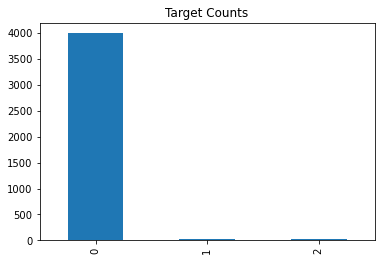

In [41]:
my_data['P_HABITABLE'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')


<AxesSubplot:title={'center':'Target Counts'}>

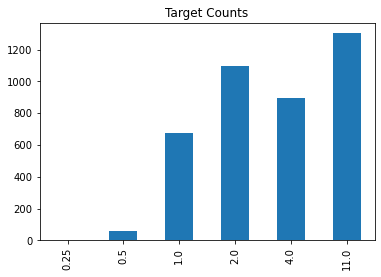

In [42]:
my_data['P_TYPE'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')


<AxesSubplot:title={'center':'Target Counts'}>

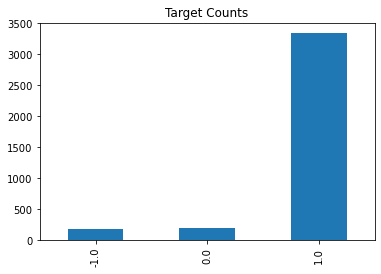

In [43]:
my_data['P_TYPE_TEMP'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')



<AxesSubplot:title={'center':'Target Counts'}>

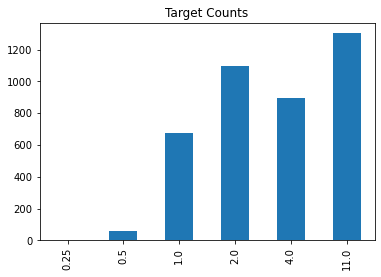

In [44]:
my_data['P_TYPE'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')


<AxesSubplot:title={'center':'Target Counts'}>

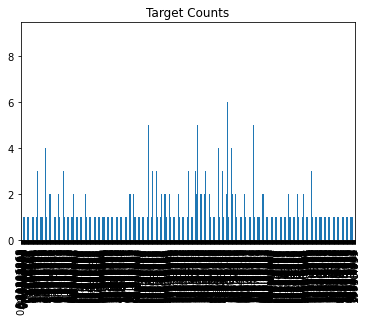

In [45]:
my_data['P_MASS'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')


<AxesSubplot:title={'center':'Target Counts'}>

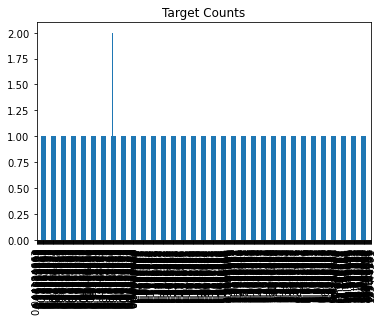

In [46]:
my_data['P_GRAVITY'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')



<AxesSubplot:title={'center':'Target Counts'}>

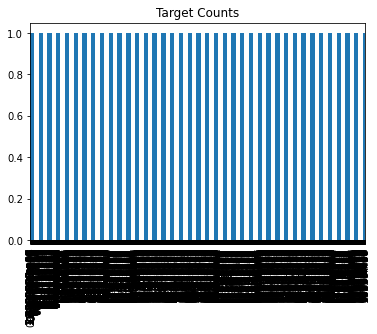

In [47]:
my_data['P_FLUX'].value_counts(sort=False).sort_index().plot(kind='bar', title='Target Counts')



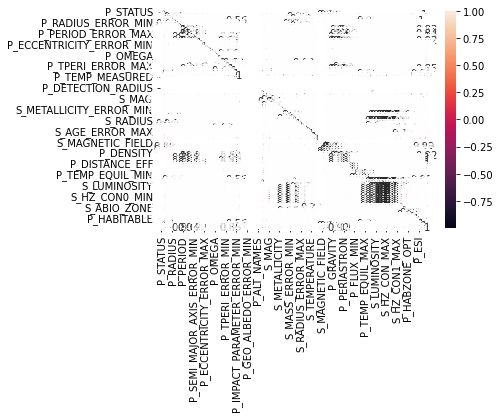

In [48]:
corr_matrix = my_data.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

In [49]:
corr_matrix

,P_STATUS,P_MASS,P_MASS_ERROR_MIN,P_MASS_ERROR_MAX,P_RADIUS,P_RADIUS_ERROR_MIN,P_RADIUS_ERROR_MAX,P_YEAR,P_PERIOD,P_PERIOD_ERROR_MIN,...,S_ABIO_ZONE,S_TIDAL_LOCK,P_HABZONE_OPT,P_HABZONE_CON,P_TYPE_TEMP,P_HABITABLE,P_ESI,P_RADIUS_EST,P_MASS_EST,P_SEMI_MAJOR_AXIS_EST
P_STATUS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P_MASS,NaN,1.000000,-0.586394,0.512819,0.243671,-0.166710,0.167652,-0.096525,0.078424,-0.076798,...,0.021370,0.069970,-0.013233,-0.015723,-0.213603,-0.064295,-0.141129,0.260319,1.000000,0.212207
P_MASS_ERROR_MIN,NaN,-0.586394,1.000000,-0.847396,-0.218779,0.609500,-0.598256,0.027366,-0.053413,0.052059,...,0.000296,-0.169041,0.033788,0.027341,0.056098,0.022998,0.080344,-0.115873,-0.586394,-0.099808
P_MASS_ERROR_MAX,NaN,0.512819,-0.847396,1.000000,0.090935,-0.288775,0.285434,-0.020358,0.048079,-0.046210,...,-0.001233,0.049145,-0.035744,-0.028855,-0.102196,-0.020819,-0.072911,0.092648,0.512819,0.069684
P_RADIUS,NaN,0.243671,-0.218779,0.090935,1.000000,-0.419165,0.305165,-0.258949,0.063718,-0.041956,...,-0.022206,0.230178,-0.026125,-0.018795,-0.033314,-0.051233,-0.676777,1.000000,0.414232,0.086249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P_HABITABLE,NaN,-0.064295,0.022998,-0.020819,-0.051233,0.024242,-0.022894,0.037158,-0.002153,0.002093,...,-0.003187,-0.144403,0.491481,0.298875,-0.210561,1.000000,0.427273,-0.076826,-0.037088,-0.006669
P_ESI,NaN,-0.141129,0.080344,-0.072911,-0.676777,0.201943,-0.150495,0.182560,-0.024672,0.024136,...,-0.009657,-0.368485,0.441087,0.309974,-0.099507,0.427273,1.000000,-0.585603,-0.245808,-0.047770
P_RADIUS_EST,NaN,0.260319,-0.115873,0.092648,1.000000,-0.419165,0.305165,-0.403430,0.023095,-0.019798,...,0.030292,0.202205,0.108478,0.117999,-0.320704,-0.076826,-0.585603,1.000000,0.439259,0.087746
P_MASS_EST,NaN,1.000000,-0.586394,0.512819,0.414232,-0.186111,0.137779,-0.248147,0.080493,-0.078006,...,0.030467,0.084373,0.042627,0.038299,-0.306410,-0.037088,-0.245808,0.439259,1.000000,0.223578


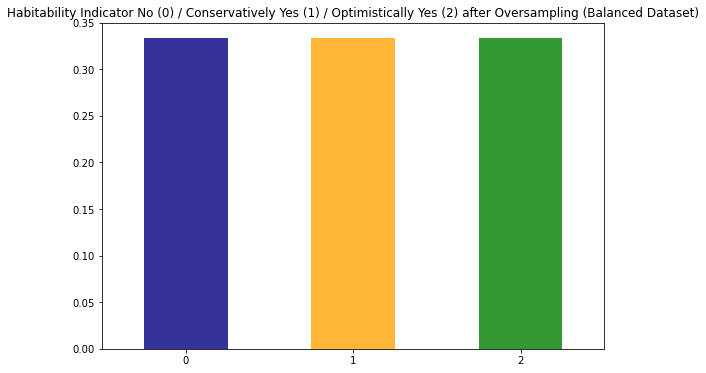

In [50]:
from sklearn.utils import resample

no = my_data[my_data.P_HABITABLE == 0]
yes_cons = my_data[my_data.P_HABITABLE == 1]
yes_opti = my_data[my_data.P_HABITABLE == 2]
yes_cons_oversampled = resample(yes_cons, replace=True, n_samples=len(no), random_state=12345)
oversampled = pd.concat([no, yes_cons_oversampled])
yes_opti_oversampled = resample(yes_opti, replace=True, n_samples=len(no), random_state=12345)
oversampled = pd.concat([oversampled, yes_opti_oversampled])

fig = plt.figure(figsize = (9,6))
oversampled.P_HABITABLE.value_counts(normalize = True, ascending = False).plot(kind='bar', color= ['navy','orange','green'], alpha = 0.8, rot=0)
plt.title('Habitability Indicator No (0) / Conservatively Yes (1) / Optimistically Yes (2) after Oversampling (Balanced Dataset)')
plt.show()

In [51]:
oversampled['P_HABITABLE'].value_counts(normalize=True)

0    0.333333
1    0.333333
2    0.333333
Name: P_HABITABLE, dtype: float64

# B Data analysis:

In [52]:
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_TYPE, y=oversampled.P_HABITABLE, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()


In [53]:
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_MASS, y=oversampled.P_HABITABLE, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()


In [54]:
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.S_MASS, y=oversampled.P_HABITABLE, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()

In [55]:
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_GRAVITY, y=oversampled.P_HABITABLE, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()

In [56]:
import plotly.express as px
fig = px.scatter(oversampled, x=oversampled.P_TYPE, y=oversampled.P_HABITABLE, color=oversampled.P_HABITABLE,
                 hover_name=oversampled.P_NAME, log_x=True, size_max=30)
fig.show()

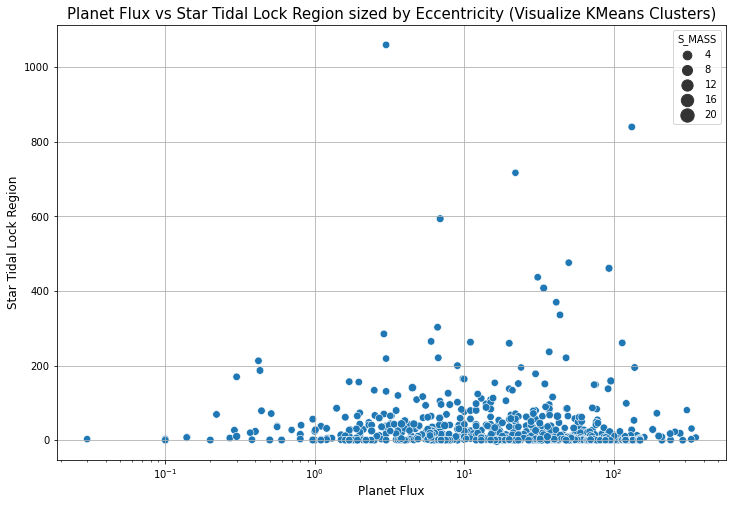

In [57]:
import seaborn as sns
plt.rcParams['axes.facecolor'] = 'white'
plt.figure(figsize=(12,8))
#Planet Flux vs Star Tidal Lock Region
g =sns.scatterplot(x=my_data.iloc[:,24], y=my_data.iloc[:,28],

              data=my_data,
              palette=['green','orange','red'], edgecolor='white', size='S_MASS', sizes=(50,200));
g.set(xscale="log");
g.grid(True)
plt.title("Planet Flux vs Star Tidal Lock Region sized by Eccentricity (Visualize KMeans Clusters)", fontsize=15)
plt.xlabel("Planet Flux", fontsize=12)
plt.ylabel("Star Tidal Lock Region", fontsize=12)
plt.rcParams['axes.facecolor'] = 'white'
plt.show()


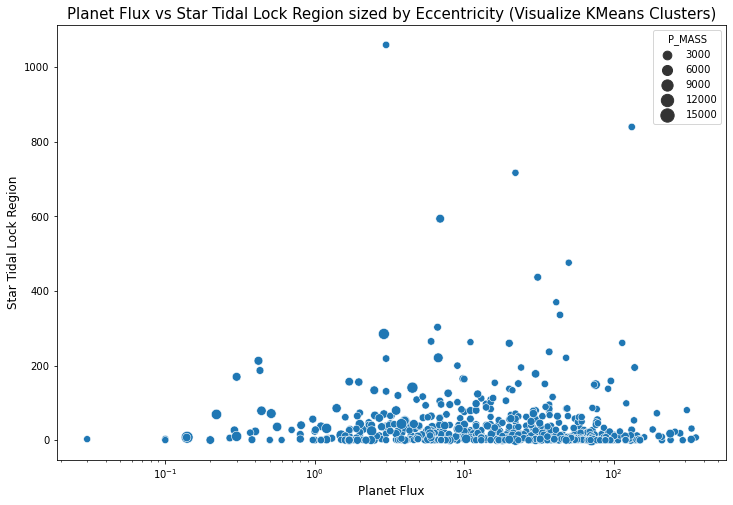

In [58]:
import seaborn as sns
plt.rcParams['axes.facecolor'] = 'white'
plt.figure(figsize=(12,8))
#Planet Flux vs Star Tidal Lock Region
g =sns.scatterplot(x=my_data.iloc[:,24], y=my_data.iloc[:,28],

              data=my_data,
              palette=['green','orange','red'], edgecolor='white', size='P_MASS', sizes=(50,200));
g.set(xscale="log");
g.grid(False)
plt.title("Planet Flux vs Star Tidal Lock Region sized by Eccentricity (Visualize KMeans Clusters)", fontsize=15)
plt.xlabel("Planet Flux", fontsize=12)
plt.ylabel("Star Tidal Lock Region", fontsize=12)
plt.rcParams['axes.facecolor'] = 'white'
plt.show()


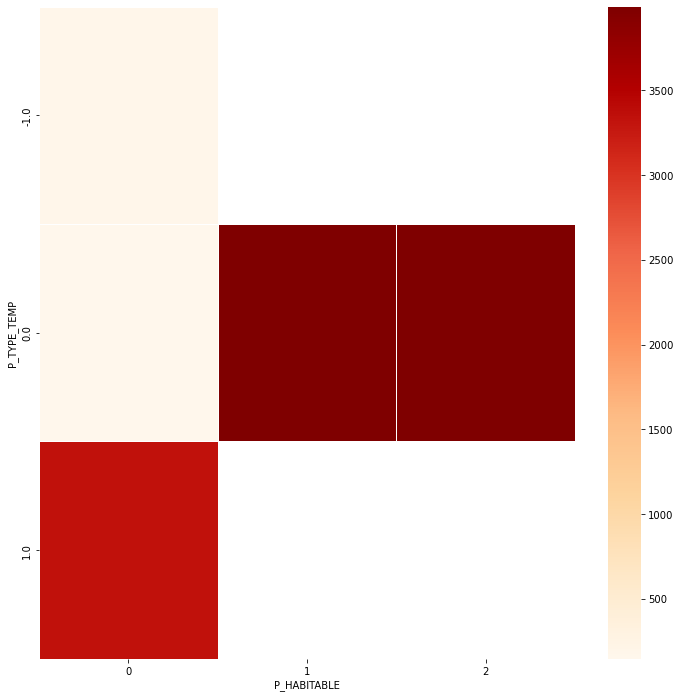

In [59]:
by_p_detec = (oversampled
            .groupby('P_DETECTION')
            .filter(lambda x : len(x) > 5)
            .groupby(['P_TYPE_TEMP', 'P_HABITABLE'])
            .size()
            .unstack()
           )
import seaborn as sns
plt.figure(figsize=(12,12))
g = sns.heatmap(
    by_p_detec,
    square=False,
   # cbar_kws={'fraction' : 0.01},
    cmap='OrRd',
    linewidth=1
)

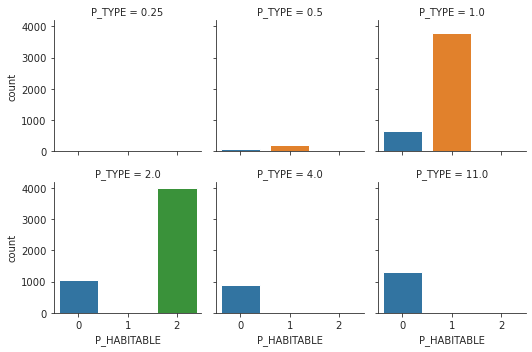

In [60]:
import seaborn as sns

with sns.axes_style(style='ticks'):
    g = sns.catplot(
        x="P_HABITABLE",
        col="P_TYPE",
        col_wrap=3,
        data=oversampled,
        kind="count",
        height=2.5,
        aspect=1.0
    )

# Planet Type: (Jovian, Superterran, Neptunian, Subterran, Terran, Miniterran). Their atmosphere can be potentially different. Terrans are able to hold a significant atmosphere with liquid water within the habitable zone (Eg: Earth). Superterrans are able to hold dense atmospheres with liquid water within the habitable zone. Subterrans are able to hold a significant atmospheres after the outer edges of the habitable zone (Eg: Mars). Jovians can have superdense atmospheres in the hot zone. Neptunians can have dense atmospheres in the hot zone. For details, check Mass-Radius Classification of Exoplanets Star Spectral Type (A,B,F,G,K,M,O): This classification is based mostly on Hydrogen absorption lines. Class A: Stars with darkest H absorbtion lines; Class B: Stars with not as dark lines as Clas

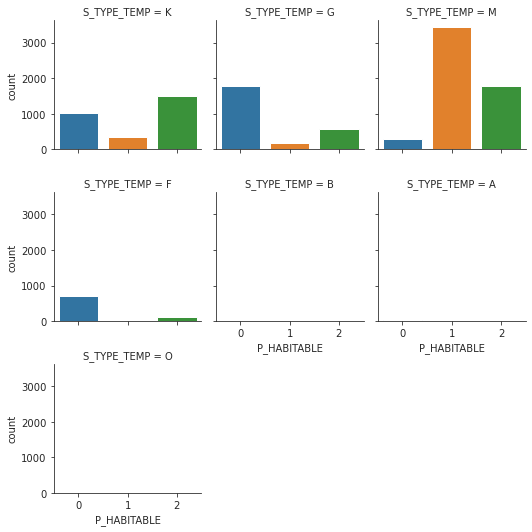

In [61]:
import seaborn as sns

with sns.axes_style(style='ticks'):
    g = sns.catplot(
        x="P_HABITABLE",
        col="S_TYPE_TEMP",
        col_wrap=3,
        data=oversampled,
        kind="count",
        height=2.5,
        aspect=1.0
    )

# Classification

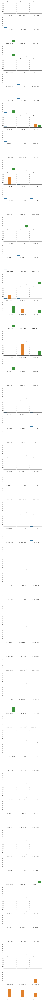

In [62]:
import seaborn as sns

with sns.axes_style(style='ticks'):
    g = sns.catplot(
        x="P_HABITABLE",
        col="S_TYPE",
        col_wrap=3,
        data=oversampled,
        kind="count",
        height=2.5,
        aspect=1.0
    )

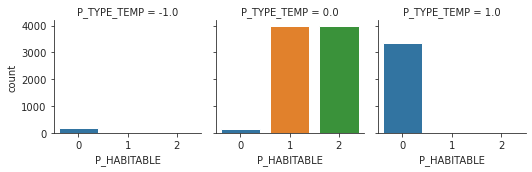

In [63]:
import seaborn as sns

with sns.axes_style(style='ticks'):
    g = sns.catplot(
        x="P_HABITABLE",
        col="P_TYPE_TEMP",
        col_wrap=3,
        data=oversampled,
        kind="count",
        height=2.5,
        aspect=1.0
    )

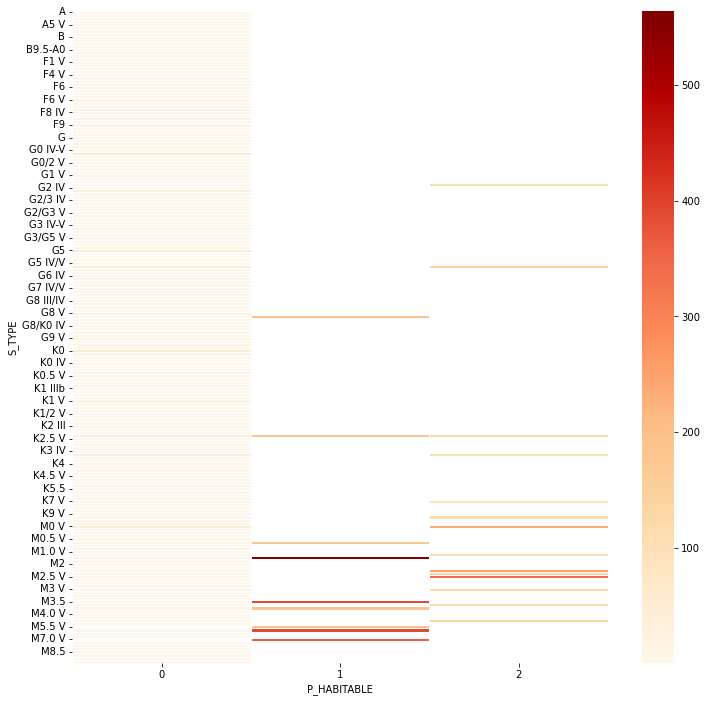

In [64]:
by_p_detec = (oversampled
            .groupby('P_DETECTION')
            .filter(lambda x : len(x) > 5)
            .groupby(['S_TYPE', 'P_HABITABLE'])
            .size()
            .unstack()
           )
import seaborn as sns
plt.figure(figsize=(12,12))
g = sns.heatmap(
    by_p_detec,
    square=False,
   # cbar_kws={'fraction' : 0.01},
    cmap='OrRd',
    linewidth=1
)

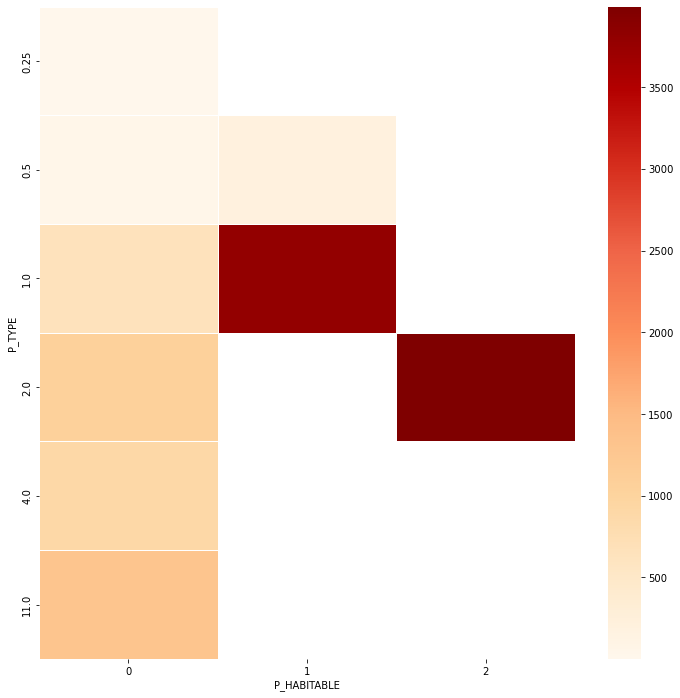

In [65]:
by_p_detec = (oversampled
            .groupby('P_DETECTION')
            .filter(lambda x : len(x) > 5)
            .groupby(['P_TYPE', 'P_HABITABLE'])
            .size()
            .unstack()
           )
import seaborn as sns
plt.figure(figsize=(12,12))
g = sns.heatmap(
    by_p_detec,
    square=False,
   # cbar_kws={'fraction' : 0.01},
    cmap='OrRd',
    linewidth=1
)

<AxesSubplot:title={'center':'Target Counts'}>

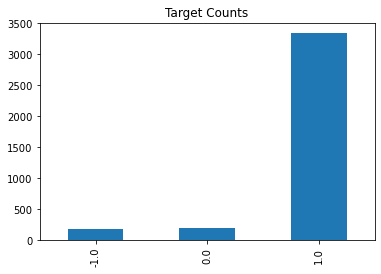

In [66]:
my_data['P_TYPE_TEMP'].value_counts(sort=True).sort_index().plot(kind='bar', title='Target Counts')


/home/samuel/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



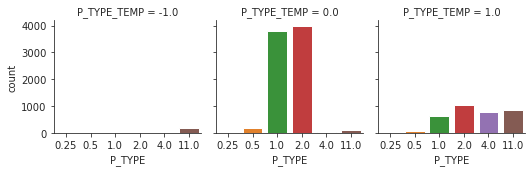

In [67]:
import seaborn as sns
with sns.axes_style(style='ticks'):
    g = sns.catplot("P_TYPE", col="P_TYPE_TEMP", col_wrap=3, data=oversampled, kind="count", height=2.5, aspect=1.0)


/home/samuel/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



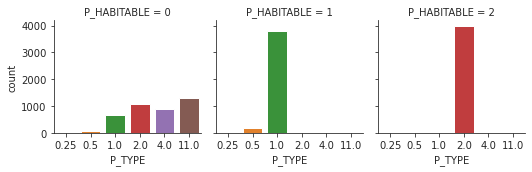

In [68]:
import seaborn as sns
with sns.axes_style(style='ticks'):
    g = sns.catplot("P_TYPE", col="P_HABITABLE", col_wrap=3, data=oversampled, kind="count", height=2.5, aspect=1.0)




# Linear and Logistic expression

In [69]:



import pandas as pd
import statsmodels.api as sm

# Load the data
# Assuming the data is stored in a CSV file named 'exoplanet_data.csv'
my_data = pd.read_csv('phl_exoplanet_catalog_2019.csv')

# Drop rows with missing values in 'P_MASS' and 'P_HABITABLE' columns
my_data.dropna(subset=['P_MASS', 'P_HABITABLE', 'S_MASS', 'P_GRAVITY'], inplace=True)

# Create the design matrix X and the response vector y
X = my_data[['P_MASS', 'S_MASS', 'P_GRAVITY']]  # predictors
y = my_data['P_HABITABLE']  # response

# Add a constant term to the design matrix (for the intercept term)
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Print the model summary
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:            P_HABITABLE   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.974
Date:                Tue, 12 Dec 2023   Prob (F-statistic):              0.117
Time:                        13:39:56   Log-Likelihood:                 391.56
No. Observations:                 660   AIC:                            -775.1
Df Residuals:                     656   BIC:                            -757.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0276      0.008      3.350      0.0

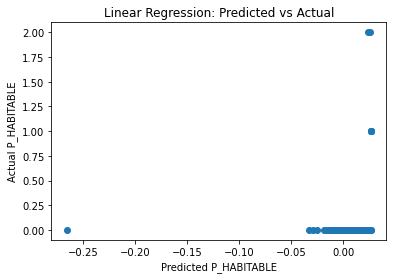

In [70]:
import matplotlib.pyplot as plt

# Plot predicted values against actual values
plt.scatter(model.fittedvalues, y)
plt.xlabel('Predicted P_HABITABLE')
plt.ylabel('Actual P_HABITABLE')
plt.title('Linear Regression: Predicted vs Actual')
plt.show()

Optimization terminated successfully.
         Current function value: 0.014387
         Iterations 17
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  660
Model:                          Logit   Df Residuals:                      656
Method:                           MLE   Df Model:                            3
Date:                Tue, 12 Dec 2023   Pseudo R-squ.:                  0.4194
Time:                        13:39:56   Log-Likelihood:                -9.4956
converged:                       True   LL-Null:                       -16.356
Covariance Type:            nonrobust   LLR p-value:                  0.003312
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3221      0.867      0.371      0.710      -1.378       2.022
P_MASS        -0.0098      0

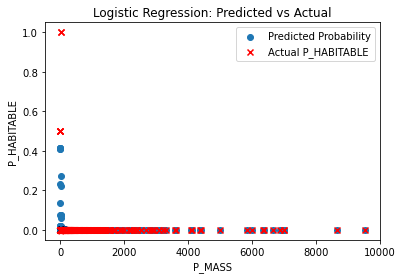

In [71]:
from sklearn.preprocessing import MinMaxScaler

# Create an instance of MinMaxScaler
scaler = MinMaxScaler()

# Rescale the response variable y
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

# Fit the logistic regression model with the rescaled y
model = sm.Logit(y_scaled, X).fit()

# Print the model summary
print(model.summary())

# Plot the predicted probabilities
fig, ax = plt.subplots()
ax.scatter(X['P_MASS'], model.predict(X), label='Predicted Probability')
ax.scatter(X['P_MASS'], y_scaled, marker='x', color='red', label='Actual P_HABITABLE')
ax.set_xlabel('P_MASS')
ax.set_ylabel('P_HABITABLE')
ax.legend()
plt.title('Logistic Regression: Predicted vs Actual')
plt.show()


Optimization terminated successfully.
         Current function value: 0.014387
         Iterations 17
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  660
Model:                          Logit   Df Residuals:                      656
Method:                           MLE   Df Model:                            3
Date:                Tue, 12 Dec 2023   Pseudo R-squ.:                  0.4194
Time:                        13:39:56   Log-Likelihood:                -9.4956
converged:                       True   LL-Null:                       -16.356
Covariance Type:            nonrobust   LLR p-value:                  0.003312
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3221      0.867      0.371      0.710      -1.378       2.022
P_MASS        -0.0098      0

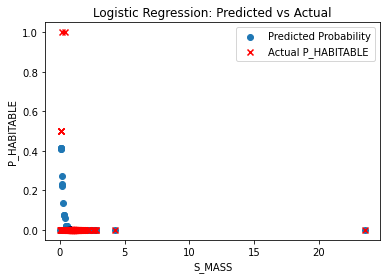

In [72]:
from sklearn.preprocessing import MinMaxScaler

# Create an instance of MinMaxScaler
scaler = MinMaxScaler()

# Rescale the response variable y
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

# Fit the logistic regression model with the rescaled y
model = sm.Logit(y_scaled, X).fit()

# Print the model summary
print(model.summary())

# Plot the predicted probabilities
fig, ax = plt.subplots()
ax.scatter(X['S_MASS'], model.predict(X), label='Predicted Probability')
ax.scatter(X['S_MASS'], y_scaled, marker='x', color='red', label='Actual P_HABITABLE')
ax.set_xlabel('S_MASS')
ax.set_ylabel('P_HABITABLE')
ax.legend()
plt.title('Logistic Regression: Predicted vs Actual')
plt.show()


/home/samuel/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f000cc4e310>
Traceback (most recent call last):
  File "/home/samuel/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/samuel/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/samuel/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/samuel/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get

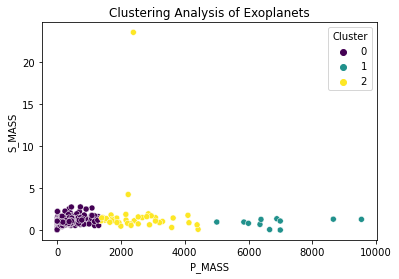

In [73]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
my_data = pd.read_csv('phl_exoplanet_catalog_2019.csv')

# Drop rows with missing values in relevant columns
my_data.dropna(subset=['P_MASS', 'P_HABITABLE', 'S_MASS', 'P_GRAVITY', 'P_TYPE'], inplace=True)

# Select relevant features for clustering
features_for_clustering = my_data[['P_MASS', 'S_MASS', 'P_GRAVITY']]

# Perform k-means clustering
num_clusters = 3  # You can choose the number of clusters based on your analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
my_data['Cluster'] = kmeans.fit_predict(features_for_clustering)

# Visualize the clusters (you can modify this based on your requirements)
sns.scatterplot(x='P_MASS', y='S_MASS', hue='Cluster', data=my_data, palette='viridis')
plt.title('Clustering Analysis of Exoplanets')
plt.xlabel('P_MASS')
plt.ylabel('S_MASS')
plt.show()